<a href="https://colab.research.google.com/github/junon/image_preprocessing_workshop/blob/main/ai_summit_opencv_workshop.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python numpy scikit-image

In [63]:
import cv2
import numpy as np
from skimage import exposure
import sys
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt

In [64]:
bad_image_path = r'/content/01_missing_hole_01_rotated.jpg' # bad image sample
reference_image_path = r'/content/01_golden_reference.JPG'
img = cv2.imread(bad_image_path)
ref_img = cv2.imread(reference_image_path)
aligned = None
img_resized = None
gray_copy = None

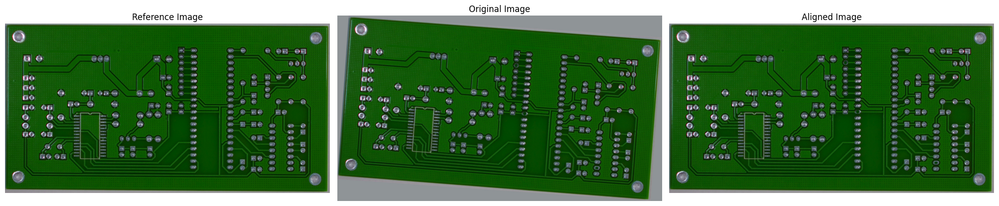

In [ ]:
def align_images(image, template, maxFeatures=500, keepPercent=0.2, debug=False):
    # convert both the input image and template to grayscale
    imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    templateGray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    # use ORB to detect keypoints and extract (binary) local invariant features
    orb = cv2.ORB_create(maxFeatures)
    (kpsA, descsA) = orb.detectAndCompute(imageGray, None)
    (kpsB, descsB) = orb.detectAndCompute(templateGray, None)
    # match the features
    method = cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING
    matcher = cv2.DescriptorMatcher_create(method)
    matches = matcher.match(descsA, descsB, None)
    # sort the matches by their distance (the smaller the distance, the "more similar" the features are)
    matches = sorted(matches, key=lambda x:x.distance)
    # keep only the top matches
    keep = int(len(matches) * keepPercent)
    matches = matches[:keep]
    # check to see if we should visualize the matched keypoints
    # if debug:
    #     matchedVis = cv2.drawMatches(image, kpsA, template, kpsB,
    #         matches, None)
    #     matchedVis = imutils.resize(matchedVis, width=1000)
    #     cv2.imshow("Matched Keypoints", matchedVis)
    #     cv2.waitKey(0)
    # allocate memory for the keypoints (x, y)-coordinates from the
    # top matches -- we'll use these coordinates to compute our homography matrix
    ptsA = np.zeros((len(matches), 2), dtype="float")
    ptsB = np.zeros((len(matches), 2), dtype="float")
    # loop over the top matches
    for (i, m) in enumerate(matches):
        # indicate that the two keypoints in the respective images map to each other
        ptsA[i] = kpsA[m.queryIdx].pt
        ptsB[i] = kpsB[m.trainIdx].pt
    # compute the homography matrix between the two sets of matched points
    (H, mask) = cv2.findHomography(ptsA, ptsB, method=cv2.RANSAC)
    # use the homography matrix to align the images
    (h, w) = template.shape[:2]
    aligned = cv2.warpPerspective(image, H, (w, h))
    # return the aligned image
    return aligned

def display_alignment():
    global aligned
    aligned = align_images(img, ref_img)

    # Convert BGR to RGB for matplotlib display
    # aligned_image_rgb = cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(ref_img)
    plt.title('Reference Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(aligned)
    plt.title('Aligned Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

display_alignment()
# # Define any widgets for interactivity, for example, sliders for maxFeatures and keepPercent
# maxFeatures_slider = widgets.IntSlider(value=500, min=100, max=1000, step=100, description='Max Features:')
# keepPercent_slider = widgets.FloatSlider(value=0.2, min=0.1, max=1.0, step=0.1, description='Keep Percent:')
# ui = widgets.VBox([maxFeatures_slider, keepPercent_slider])
# # Use ipywidgets' interactive function to bind the widgets to the display function
# interactive_display = widgets.interactive(display_alignment, maxFeatures=maxFeatures_slider, keepPercent=keepPercent_slider)
# display(ui, interactive_display)

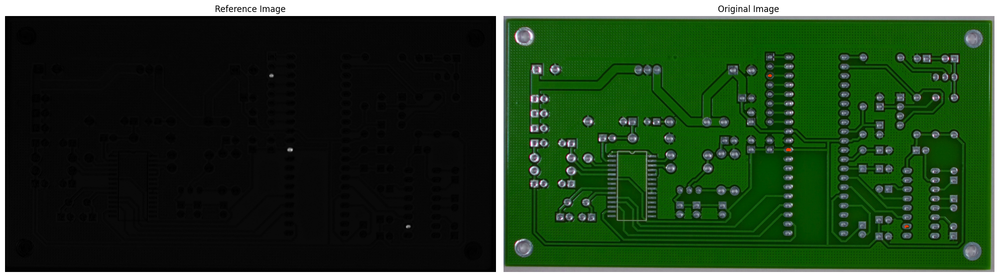

In [ ]:
def display_image_difference():
    align_gray = cv2.cvtColor(aligned, cv2.COLOR_BGR2GRAY)
    ref_img_gray = cv2.cvtColor(ref_img, cv2.COLOR_BGR2GRAY)
    # histogram matching of input image
    aligned_normalized = exposure.match_histograms(align_gray, ref_img_gray)
    aligned_normalized = exposure.rescale_intensity(aligned_normalized, out_range=(0, 255)).astype(np.uint8)
    aligned_blurred = cv2.GaussianBlur(aligned_normalized, (9,9), 0)
    ref_img_blurred = cv2.GaussianBlur(ref_img_gray, (9,9), 0) #ref_img_normalized
    aligned_gray_temp = cv2.resize(aligned_blurred, (0, 0), fx = 0.5, fy = 0.5)
    aligned_gray_height , aligned_gray_width = aligned_gray_temp.shape
    ref_img_temp = cv2.resize(ref_img_blurred, (aligned_gray_width, aligned_gray_height))
    img_diff = cv2.absdiff(aligned_gray_temp, ref_img_temp)

    _,mask = cv2.threshold(img_diff,70,255,cv2.THRESH_BINARY)
    aligned_resized = cv2.resize(aligned, (aligned_gray_width, aligned_gray_height))
    mask_bgr = cv2.merge([mask, 0*mask, 0*mask])
    output = cv2.addWeighted(mask_bgr, 1, np.asarray(aligned_resized), 1.0, 0)

    # Convert BGR to RGB for matplotlib display
    # aligned_image_rgb = cv2.cvtColor(aligned_gray_temp, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(img_diff, cmap='gray')
    plt.title('Reference Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(output)
    plt.title('Original Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if aligned is not None:
    display_image_difference()

In [ ]:
def display_resize(scaleFactor):
    global img_resized
    if aligned is not None:
        img_resized = cv2.resize(aligned, (0, 0), fx = scaleFactor, fy = scaleFactor)
    else:
        img_resized = cv2.resize(img, (0, 0), fx = scaleFactor, fy = scaleFactor)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    if aligned is not None:
        plt.imshow(aligned) # gray_copy, cmap='gray')
        plt.title('Aligned Image')
    else:
        plt.imshow(img) # gray_copy, cmap='gray')
        plt.title('Original Image')
    # plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_resized) # gray_resized, cmap='gray')
    plt.title('Resized Image')
    # plt.axis('off')

    plt.tight_layout()
    plt.show()

#Define any widgets for interactivity, for example, sliders for maxFeatures and keepPercent
scaleFactor_slider = widgets.FloatSlider(value=0.5, min=0.1, max=1.0, step=0.1, description='Scale Factor:')
ui = widgets.VBox([scaleFactor_slider])
# Use ipywidgets' interactive function to bind the widgets to the display function
interactive_display = widgets.interactive(display_resize, scaleFactor=scaleFactor_slider)
display(ui, interactive_display)

interactive(children=(FloatSlider(value=0.5, description='Scale Factor:', max=1.0, min=0.1), Output()), _dom_c…

In [ ]:

def display_gaussian_smoothing(kernelSize):
    global gray_copy
    if img_resized is not None:
        gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    elif aligned is not None:
        gray = cv2.cvtColor(aligned, cv2.COLOR_BGR2GRAY)
    else:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_copy = gray.copy()

    gray_blurred = cv2.GaussianBlur(gray_copy, (kernelSize,kernelSize), 0)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(gray_copy, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(gray_blurred, cmap='gray')
    plt.title('Image Smoothing')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

#Define any widgets for interactivity, for example, sliders for maxFeatures and keepPercent
kernelSize_slider = widgets.IntSlider(value=3, min=3, max=15, step=2, description='Kernel Size:')
ui = widgets.VBox([kernelSize_slider])
# Use ipywidgets' interactive function to bind the widgets to the display function
interactive_display = widgets.interactive(display_gaussian_smoothing, kernelSize=kernelSize_slider)
display(ui, interactive_display)

interactive(children=(IntSlider(value=3, description='Kernel Size:', max=15, min=3, step=2), Output()), _dom_c…

In [ ]:
def display_bilateral_smoothing(kernelSize,sigma):

    gray_sharpened = cv2.bilateralFilter(gray_copy, kernelSize, sigma, sigma)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(gray_copy, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(gray_sharpened, cmap='gray')
    plt.title('Image Bilateral Smoothing & Sharpening')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

#Define any widgets for interactivity, for example, sliders for maxFeatures and keepPercent
kernelSize_slider = widgets.IntSlider(value=3, min=3, max=15, step=2, description='Kernel Size:')
sigma_slider = widgets.IntSlider(value=10, min=10, max=150, step=10, description='Sigma:')
ui = widgets.VBox([kernelSize_slider,sigma_slider])
# Use ipywidgets' interactive function to bind the widgets to the display function
interactive_display = widgets.interactive(display_bilateral_smoothing, kernelSize=kernelSize_slider, sigma=sigma_slider)
display(ui, interactive_display)

interactive(children=(IntSlider(value=3, description='Kernel Size:', max=15, min=3, step=2), IntSlider(value=1…

In [ ]:
def display_global_tresholding(minThreshold):
    ret, thresh = cv2.threshold(gray_copy, minThreshold, 255, cv2.THRESH_BINARY)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(gray_copy, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresh, cmap='gray')
    plt.title('Image Global Thresholding')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

#Define any widgets for interactivity, for example, sliders for maxFeatures and keepPercent
minThreshold_slider = widgets.IntSlider(value=50, min=0, max=255, step=5, description='Min Threshold:')
ui = widgets.VBox([minThreshold_slider])
# Use ipywidgets' interactive function to bind the widgets to the display function
interactive_display = widgets.interactive(display_global_tresholding, minThreshold=minThreshold_slider)
display(ui, interactive_display)

interactive(children=(IntSlider(value=50, description='Min Threshold:', max=255, step=5), Output()), _dom_clas…

In [ ]:
def display_adaptive_tresholding(blockSize):
    thresh = cv2.adaptiveThreshold(gray_copy, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, blockSize, 2)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(gray_copy, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresh, cmap='gray')
    plt.title('Image Adaptive Thresholding')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

#Define any widgets for interactivity, for example, sliders for maxFeatures and keepPercent
blockSize_slider = widgets.IntSlider(value=3, min=3, max=29, step=2, description='Block Size:')
ui = widgets.VBox([blockSize_slider])
# Use ipywidgets' interactive function to bind the widgets to the display function
interactive_display = widgets.interactive(display_adaptive_tresholding, blockSize=blockSize_slider)
display(ui, interactive_display)

interactive(children=(IntSlider(value=3, description='Block Size:', max=29, min=3, step=2), Output()), _dom_cl…